# Yelp Ratings Analysis Base on BSSM (Binomial State Space Model) 
### 299r Xu Si

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import datetime as DT
import matplotlib.dates as mdates
%matplotlib inline

In [3]:
from IPython.display import HTML

HTML('''<script>
code_show=true; 
function code_toggle() {
 if (code_show){
 $('div.input').hide();
 } else {
 $('div.input').show();
 }
 code_show = !code_show
} 
$( document ).ready(code_toggle);
</script>
<form action="javascript:code_toggle()"><input STYLE="color: #4286f4" type="submit" value="Click here to toggle on/off the raw code."></form>''')

## Goal

We can see the development of a business through the reviews it has collected day by day. For every review, there is a rating, e.g. 4 out of 5 stars, which represents the **likeability** of the business.

We are interested in visualizing the **historical trend** of **likeability** of a business, given the stars!

## Quick Look

### 1.Business Info

In [2]:
#look at the first rows from business dataset
business = pd.read_csv("datasets/yelp_academic_dataset_business.csv", delimiter=",",low_memory=False)
business.head()

,attributes.Ambience.divey,attributes.Dietary Restrictions.vegan,attributes.Happy Hour,hours.Thursday.open,attributes.Order at Counter,attributes.Hair Types Specialized In.africanamerican,attributes.Hair Types Specialized In.kids,attributes.BYOB,hours.Friday.open,attributes.Good For.latenight,...,attributes.Noise Level,attributes.Smoking,attributes.Attire,attributes.Hair Types Specialized In.curly,attributes.Good For Groups,neighborhoods,attributes.Open 24 Hours,attributes.Ambience.romantic,attributes.Music.jukebox,attributes.Ambience.upscale
0,False,NaN,NaN,11:00,NaN,NaN,NaN,NaN,11:00,False,...,average,NaN,casual,NaN,True,[],NaN,False,NaN,False
1,NaN,NaN,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,True,[],NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,[],NaN,NaN,NaN,NaN
3,True,NaN,False,10:00,NaN,NaN,NaN,NaN,10:00,False,...,average,no,casual,NaN,True,[],NaN,False,NaN,False
4,NaN,NaN,NaN,11:00,NaN,NaN,NaN,NaN,11:00,NaN,...,NaN,NaN,NaN,NaN,True,[],NaN,NaN,NaN,NaN


**Summary**

In [5]:
print 'Number of Business:', business.shape[0], '\n', 'Number of Cities: ', len(business.city.unique()),'\n', 'Number of States: ', len(business.state.unique())

Number of Business: 85901 
Number of Cities:  444 
Number of States:  30


In [14]:
print 'cities:\n',business['city'].value_counts()

cities:
Las Vegas                     19328
Phoenix                       11852
Charlotte                      5695
Scottsdale                     5638
Montréal                       4371
Mesa                           3638
Pittsburgh                     3628
Edinburgh                      3360
Henderson                      3145
Tempe                          3043
Chandler                       2702
Madison                        2278
Glendale                       2048
Gilbert                        1941
Peoria                         1081
North Las Vegas                 952
Karlsruhe                       906
Surprise                        681
Goodyear                        507
Champaign                       505
Avondale                        427
Matthews                        399
Queen Creek                     383
Waterloo                        297
Fort Mill                       287
Urbana                          286
Cave Creek                      266
Middleton           

In [73]:
lv = business[business['city'] == 'Las Vegas']
lv['categories'].value_counts()

['Mexican', 'Restaurants']                                                                                                                    353
['Pizza', 'Restaurants']                                                                                                                      247
['Beauty & Spas', 'Nail Salons']                                                                                                              244
['Hair Salons', 'Beauty & Spas']                                                                                                              226
['Home Services', 'Real Estate', 'Apartments']                                                                                                208
['Food', 'Coffee & Tea']                                                                                                                      202
['Arts & Entertainment', 'Performing Arts']                                                                                 

In [9]:
print 'Categories: \n',business['categories'].value_counts()

Categories: 
['Mexican', 'Restaurants']                                                                                                             1680
['Pizza', 'Restaurants']                                                                                                               1298
['Food', 'Coffee & Tea']                                                                                                               1206
['Beauty & Spas', 'Nail Salons']                                                                                                       1183
['Hair Salons', 'Beauty & Spas']                                                                                                       1127
['Hotels & Travel', 'Event Planning & Services', 'Hotels']                                                                             1114
['Chinese', 'Restaurants']                                                                                                              943
['Home 

### 2.Reviews Info

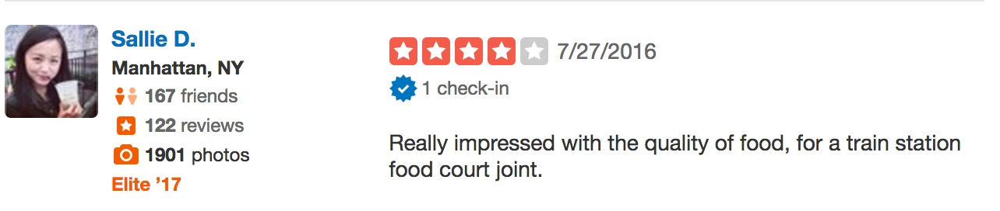

From:  https://www.yelp.com/biz/oath-craft-pizza-boston


In [6]:
from IPython.display import Image, display
display(Image(filename='pics/Rating Demo.jpeg'))
print 'From: ', 'https://www.yelp.com/biz/oath-craft-pizza-boston'

In [3]:
review = pd.read_csv("datasets/yelp_academic_dataset_review.csv",delimiter=",")
review.head(3)

,user_id,review_id,text,votes.cool,business_id,votes.funny,stars,date,type,votes.useful
0,PUFPaY9KxDAcGqfsorJp3Q,Ya85v4eqdd6k9Od8HbQjyA,"Mr Hoagie is an institution. Walking in, it do...",0,5UmKMjUEUNdYWqANhGckJw,0,4,2012-08-01,review,0
1,Iu6AxdBYGR4A0wspR9BYHA,KPvLNJ21_4wbYNctrOwWdQ,Excellent food. Superb customer service. I mis...,0,5UmKMjUEUNdYWqANhGckJw,0,5,2014-02-13,review,0
2,auESFwWvW42h6alXgFxAXQ,fFSoGV46Yxuwbr3fHNuZig,Yes this place is a little out dated and not o...,0,5UmKMjUEUNdYWqANhGckJw,1,5,2015-10-31,review,1


**Summary**

In [9]:
print "number of reviews: ", review.shape[0]
print "number of business: ", review["business_id"].unique().shape[0]
print "average reviews per business: ", review.shape[0] / review["business_id"].unique().shape[0]
print 'Rating Scale: ',review.stars.unique()

number of reviews:  2685066
number of business:  85539
average reviews per business:  31
Rating Scale:  [4 5 3 2 1]


In [8]:
#order all business by number of ratings
num_review = review["business_id"].value_counts()
num_review_tuple = zip(num_review.index,num_review)

In [9]:
#restuarants in las vegas
business_lv_res = business[business.categories.map(lambda x: 'Restaurant' in x)]
business_lv_res = business_lv_res[business_lv_res.city == 'Las Vegas']
print "Number of resturants in Las Vegas: " , business_lv_res.shape
num_review_lv_res = review["business_id"].value_counts()
num_review_tuple_lv_res = zip(num_review_lv_res.index,num_review_lv_res)

Number of resturants in Las Vegas:  (4928, 98)


## Analysis & Visualization

### BSSM Model

$$
\left\{
        \begin{array}{ll}
          \theta_t = \theta_{t-1} + \epsilon_t\\
          p(\theta_t) = \frac{e^{\theta_t}}{1 + e^{\theta_t}}\\
          p(\textbf{y}_t\mid \theta_t,H_t) = \prod\limits_{i = 1}^{M} \binom{5}{y_{ti}} p(\theta_t)^{y_{ti}}(1 - p(\theta_t))^{5 - y_{ti}}
        \end{array}
\right.
$$

In [116]:
#input: 
#sigma (Float): unknow parameter
#N (Int): Rating Scale e.g. 5 stars
#M (List): Number of observations at a certain point
#R (List): Total ratings at a certain point
#output:
#theta_f (List): Mean of every latent variable
#sigma_f (List): Variance of every latent variable

def filtering(sigma,N,M,R):
    
    T = len(M)            # Number of history 
    theta_i = 0           #initiate theta_0
    sigma_i = 0           #initiate sigma_0
    p_i = 0.5             #initiate p_0
    theta_f = [theta_i]   #latent variable mean
    sigma_f = [sigma_i]   #latent variable variance
    p_f = [p_i]           #latent p
    
    #iterate to calculate theta_f and sigma_f
    for i in range(T):
       
        sigma_i = 1/(M[i]*N*np.exp(theta_i)/(1+np.exp(theta_i))**2 + 1/(sigma_i + sigma)) #update sigma_i
        theta_i = theta_i + sigma_i * (R[i] - M[i] * N * p_i) #update   theta_i
        p_i = np.exp(theta_i)/(1+np.exp(theta_i)) #update p
        
        theta_f.append(theta_i)
        sigma_f.append(sigma_i)
        p_f.append(p_i)
        
    return theta_f,sigma_f,p_f

def smoothing(sigma, N, M, R):
    
    theta_f,sigma_f,_ = filtering(sigma,N,M,R)
    
    T = len(M)# Number of history
    theta_i = theta_f[-1] #initiate theta_0
    sigma_i = sigma_f[-1] #initiate signma_0
    theta_s = [theta_i]
    sigma_s = [sigma_i]
    
    for i in range(T):
        A = sigma_f[T-i-1]/(sigma_f[T-i-1] + sigma)
        theta_i = theta_f[T-i-1] + A * (theta_i - theta_f[T-i-1])
        sigma_i = sigma_f[T-i-1] + A * (sigma_i - sigma_f[T-i-1])
        
        theta_s.append(theta_i)
        sigma_s.append(sigma_i)
        
        
    return theta_s[::-1], sigma_s[::-1], theta_f, sigma_f 

def EM(sigma0, N, M, R):
    
    T = len(M)# Number of history
    sigma_old = 1000000
    sigma_new = sigma0
    n = 0
    p_lows = [] #skip the initial value 0 for plotting
    p_highs = []

    while (abs(sigma_old - sigma_new) > 0.00001):
        
        n += 1 
        sigma_old = sigma_new
        
        theta_s, sigma_s, theta_f, sigma_f  = smoothing(sigma_old, N, M, R)
        W_k = np.square(theta_s) + sigma_s 
        W_kk_1 = [(sigma_f[i]/(sigma_f[i] + sigma_old) * sigma_s[i+1] + theta_s[i] * theta_s[i+1]) for i in range(T)]
        sigma_new = (2 * np.sum(W_k) - W_k[0] - W_k[-1])/ T - 2 * np.mean(W_kk_1)
    
    
    #get best estimate of mean and variance of the latent variables
    theta_EM,sigma_EM,p_EM = filtering(sigma_new,N,M,R)

    for theta, sigma in zip(theta_EM,sigma_EM)[1:]: #skip the initial values (0,0)
        
        samples = np.random.normal(theta, sigma, 10000)
        ps = map(lambda x: np.exp(x)/(1 + np.exp(x)),samples)
        p_low, p_high = np.percentile(ps,[2.5,97.5])
        p_lows.append(p_low)
        p_highs.append(p_high)
    
    return p_EM[1:], p_lows, p_highs

In [120]:
kw = lambda x: x.isocalendar()[1]
class Restuarant:
    #initiate datasets
    def __init__(self, ID, busi_data, review_data):
         
        self.business = busi_data
        self.review = review_data
        self.ID = ID
        self.name = self.business[self.business["business_id"] == self.ID]["name"].values[0]
        self.target =  self.review[self.review["business_id"] == ID][["stars","date"]]
        self.target["date"] =  pd.to_datetime(self.target['date'], format = '%Y-%m-%d')
        self.target.index = self.target["date"].values
        self.target["year"] = self.target.index.year
        self.target["month"] = self.target.index.month
        self.target["week"] = self.target.index.week
        self.target["day"] = self.target.index.day        
        
    #find whole name of a restuarant by matching partial str
    def find_res_by_name(self, name):
        matched_res_index = self.business['name'].str.contains(name)
        self.find_by_match = self.business[matched_res_index][['name','business_id']]
        return self.find_by_match

    def reviews_week (self):

        self.target_review_week = self.target[["day","stars","year","week","date"]].groupby([self.target.index.year,self.target.index.week]).agg({"day": lambda x: x.shape[0],
                                 "stars": lambda x: x.sum(), 
                                 "year": lambda x: x.values[0],
                                 "week": lambda x: x.values[0]
                               }).apply(pd.to_numeric)
        
        self.target_review_week.rename(columns = {'day':'counts'}, inplace = True)  


    def plot_reviews (self, plot = True):
        print self.name
       
        #EM 
        total_stars = self.target_review_week['stars'].values
        number_rating = self.target_review_week['counts'].values
        rating_scale = 5
        
        p,p_low,p_up= EM(0.5,rating_scale,number_rating,total_stars)
        
        #simple p just dividing 
        simple_p = total_stars / (number_rating * 5.)
        
        #convert probability to stars
        star_low = [5 * i for i in p_low]
        star_up = [5 * i for i in p_up]
        star = [5 * i for i in p]
        
        if plot:
            #plot ratings by week
            fig,ax = plt.subplots(2,2,figsize = (20,10))

            ax[0][0].plot(range(len(p)), self.target_review_week['counts'])
            ax[0][0].set_title('Number of Ratings by Week',fontsize=20)
            ax[0][0].set_ylabel('Number of ratings',fontsize=15)
            ax[0][0].set_xlabel('Week',fontsize=15)
            #ax[1][0].xaxis.set_major_formatter(self.xformat_y_m)

            line_1, = ax[0][1].plot(range(len(p)),star,c = 'b',label = 'BSSM_p') #estimated hidden state
            #line_2, = ax[1].plot(range(len(p)),simple_p,c = 'r',label = 'Simple_p',alpha = 0.6) #from the data
            ax[0][1].fill_between(range(len(p)),star_low, star_up,color='blue',alpha=0.2)
            blue_patch = mpatches.Patch(color='blue', alpha = 0.4,label='Uncertainty')
            #ax[1].legend(loc = 4,handles=[line_2,line_1, blue_patch])
            ax[0][1].legend(loc = 4,handles=[line_1, blue_patch])
            ax[0][1].set_ylim(0,5)
            ax[0][1].set_ylabel('Estimated Stars',fontsize=15)
            ax[0][1].set_xlabel('Week',fontsize=20)
            #ax[1][1].xaxis.set_major_formatter(self.xformat_y_m)
            ax[0][1].set_title('Estimated Stars by Week',fontsize=20)
    
    
            #weeks in every year
        
            years = self.target['year'].unique()
            for year in years:
                temp = self.target_review_week.loc[year]
                ax[1][0].plot(temp['week'],temp['counts'],label = year,lw = 1)
                
                
                #plot p
                p,p_low,p_up = EM(0.5,5,temp['counts'].values,temp['stars'].values)
        
                #convert probability to stars
                star_low = [5 * i for i in p_low]
                star_up = [5 * i for i in p_up]
                star = [5 * i for i in p]
                ax[1][1].plot(temp['week'],star,label = year)
                ax[1][1].set_ylim(0,5)
                
                
            plt.show()

Bobby Q


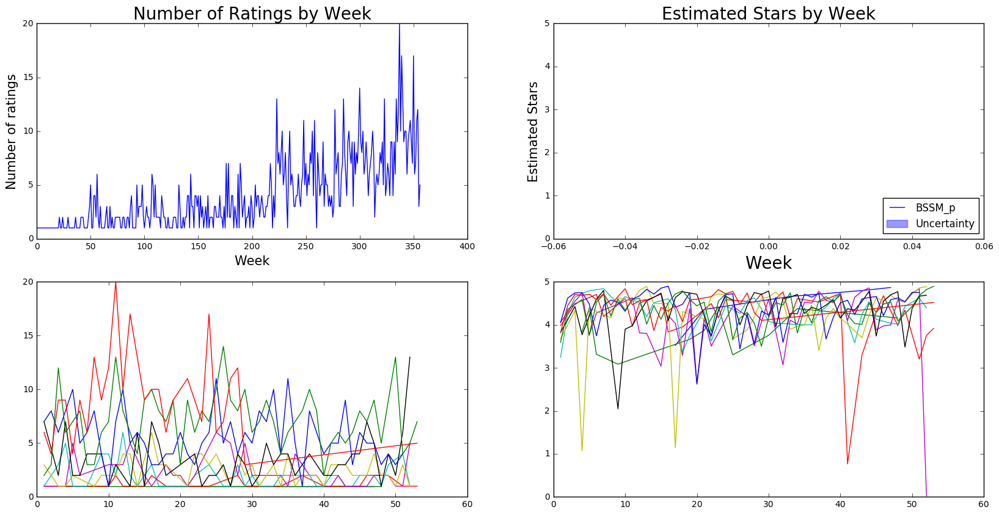

In [186]:
for i in range(1):
    ID = num_review_tuple_lv_res[62][0]
    res = Restuarant(ID,business,review)
    res.reviews_week()
    res.plot_reviews()

Mesa Grill


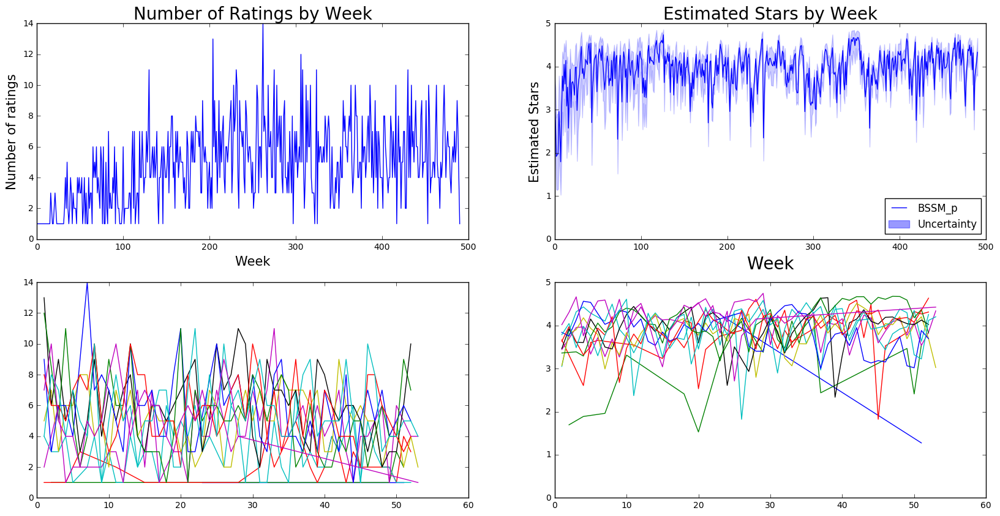

McCarran International Airport


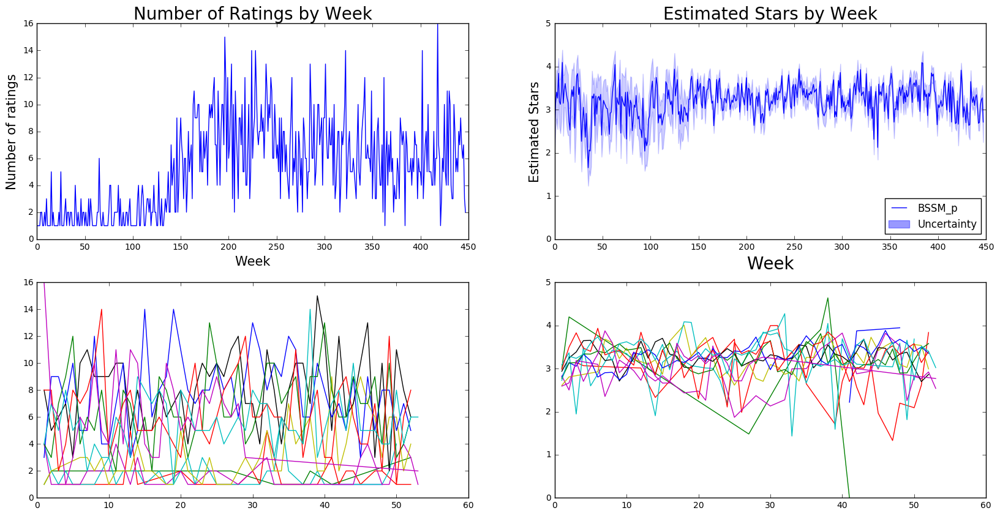

The Venetian Las Vegas


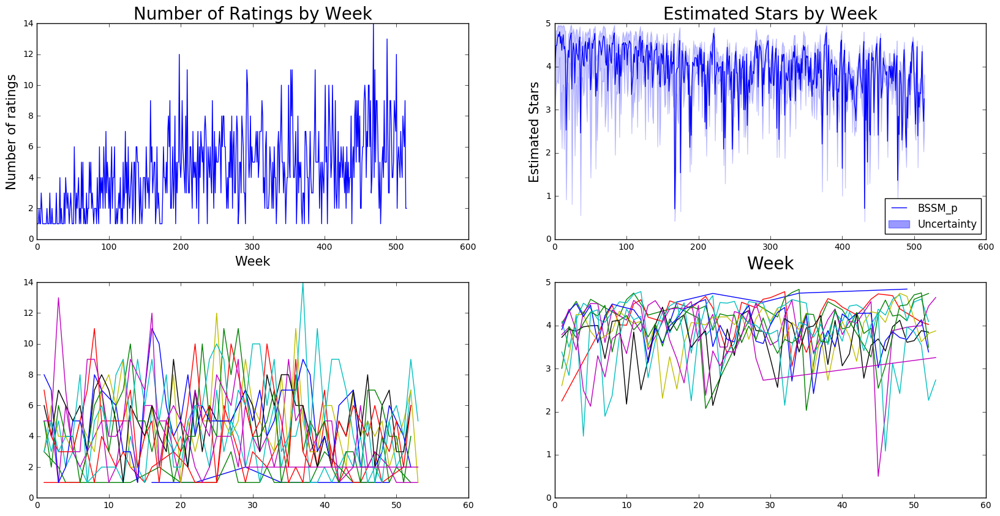

Gordon Ramsay Steak


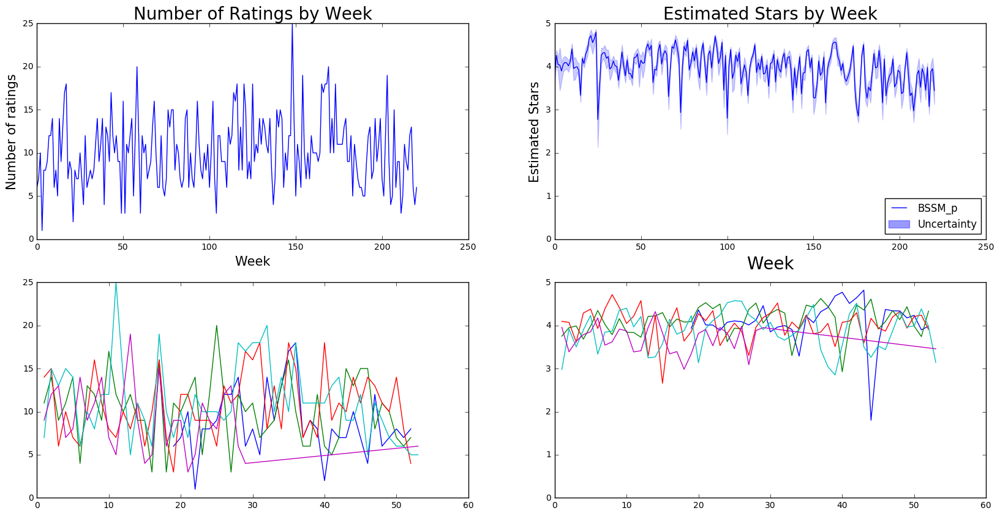

Flamingo Las Vegas Hotel & Casino


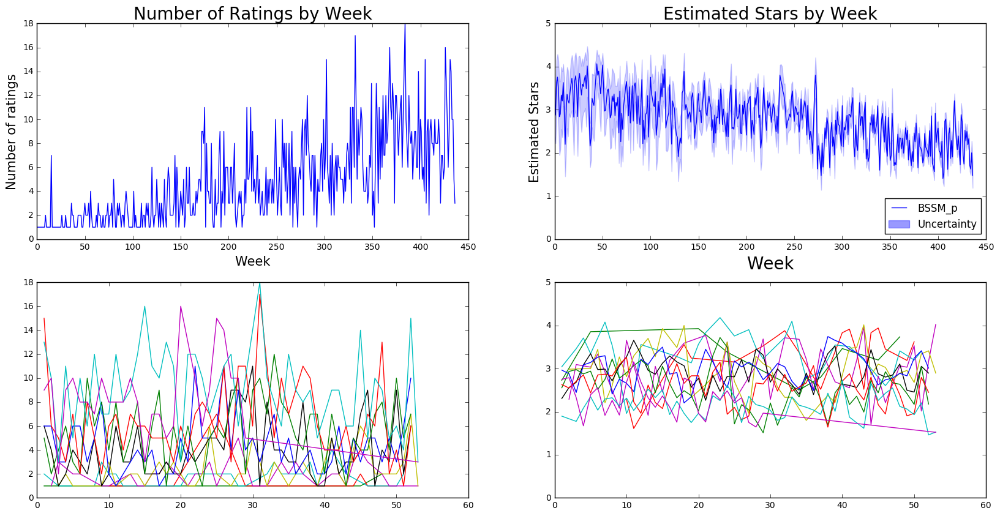

Holsteins Shakes and Buns


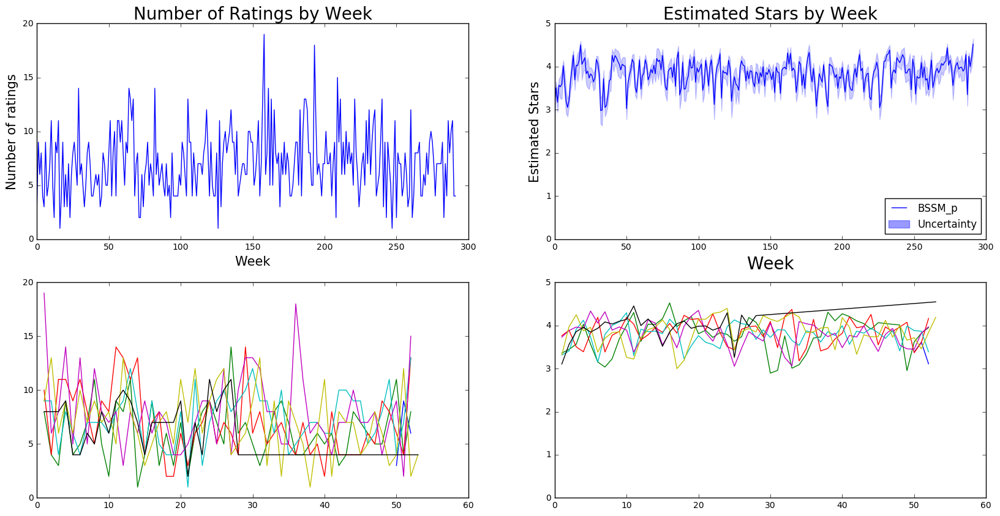

Planet Hollywood Las Vegas Resort & Casino


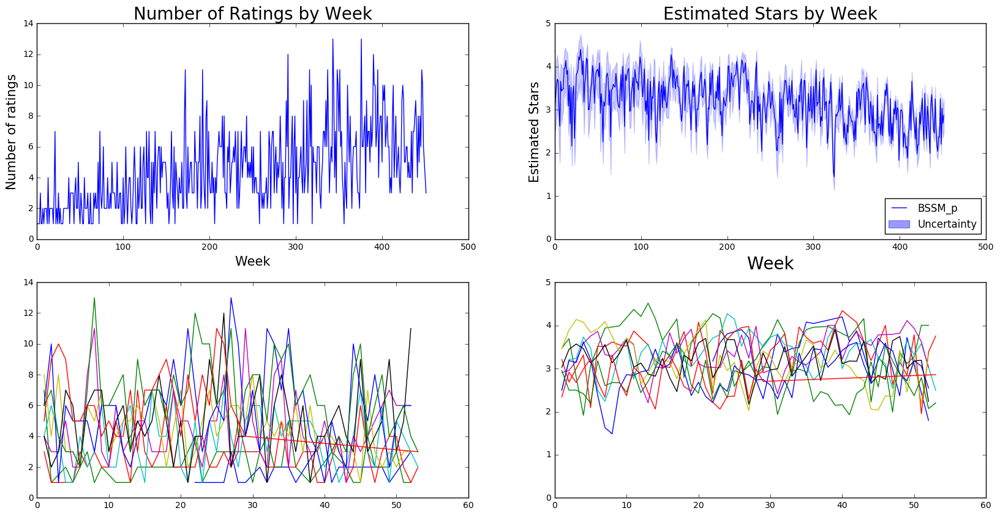

Burger Bar


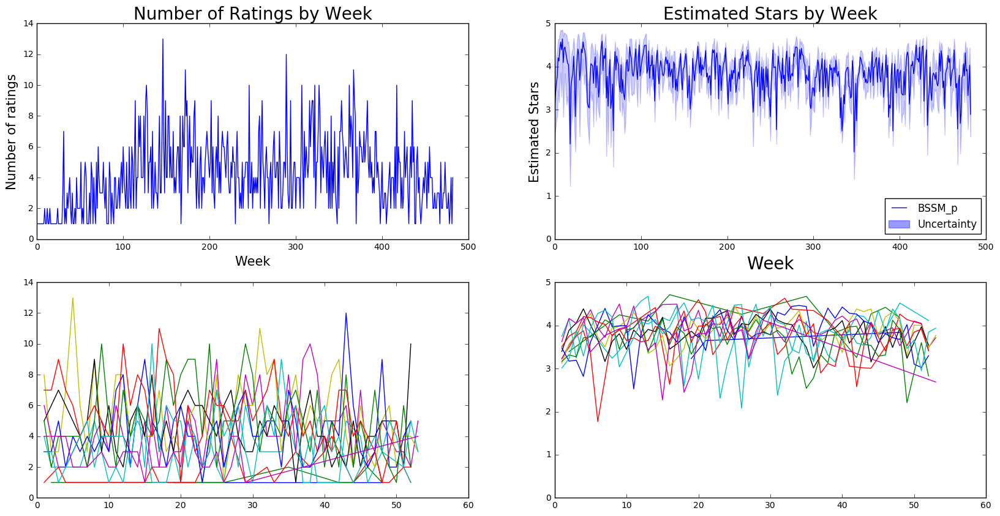

Bellagio Hotel


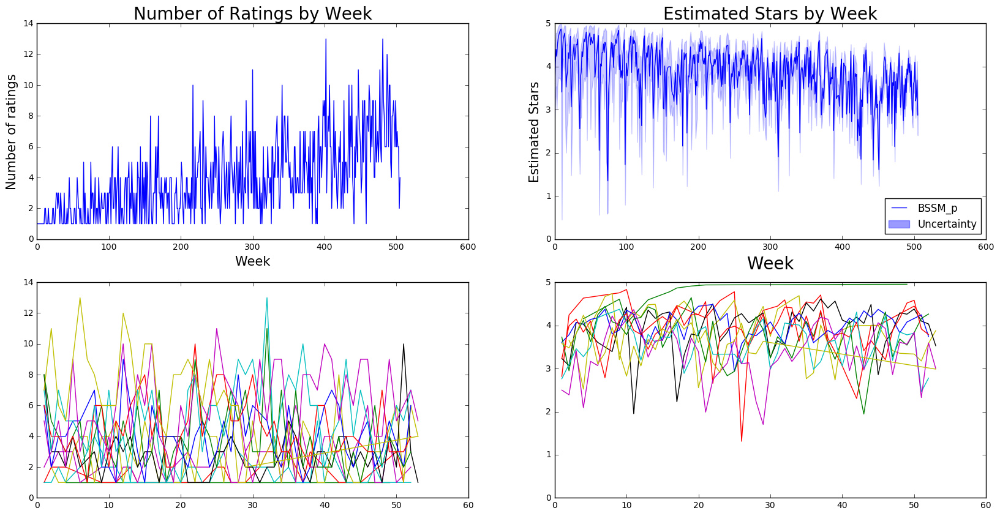

Pho Kim Long


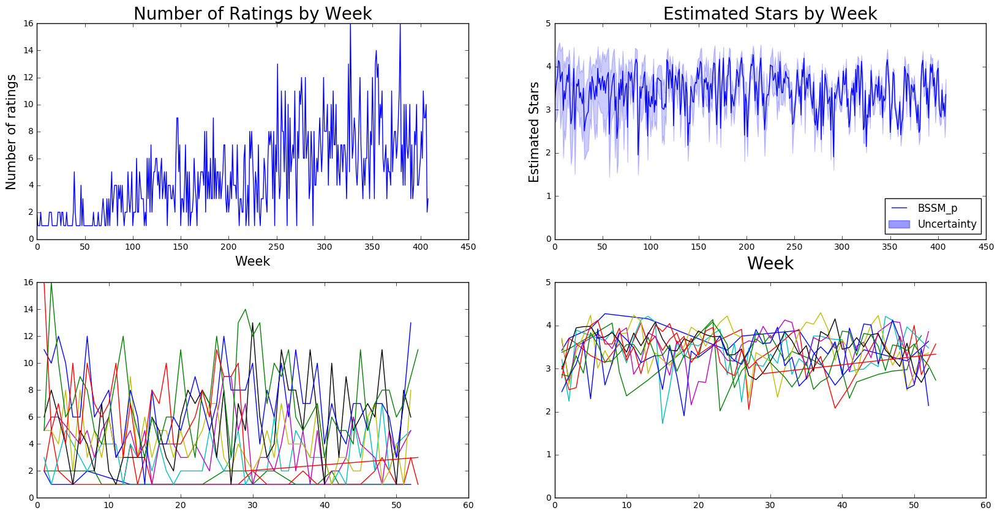

Egg & I


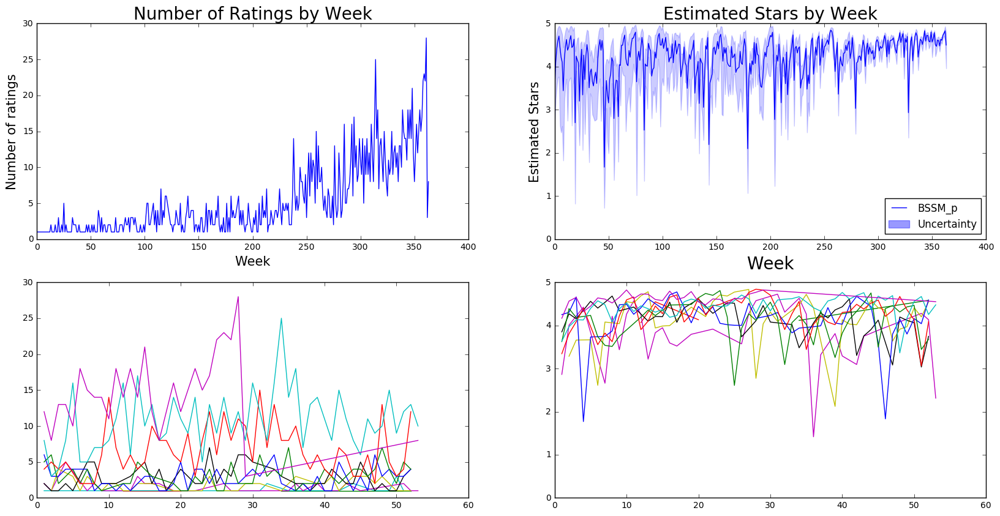

Grand Lux Cafe


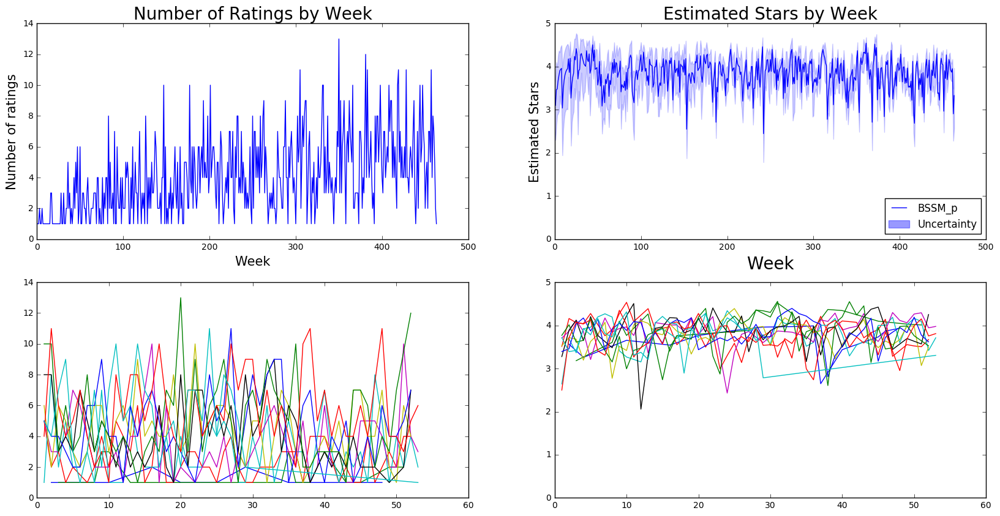

El Dorado Cantina


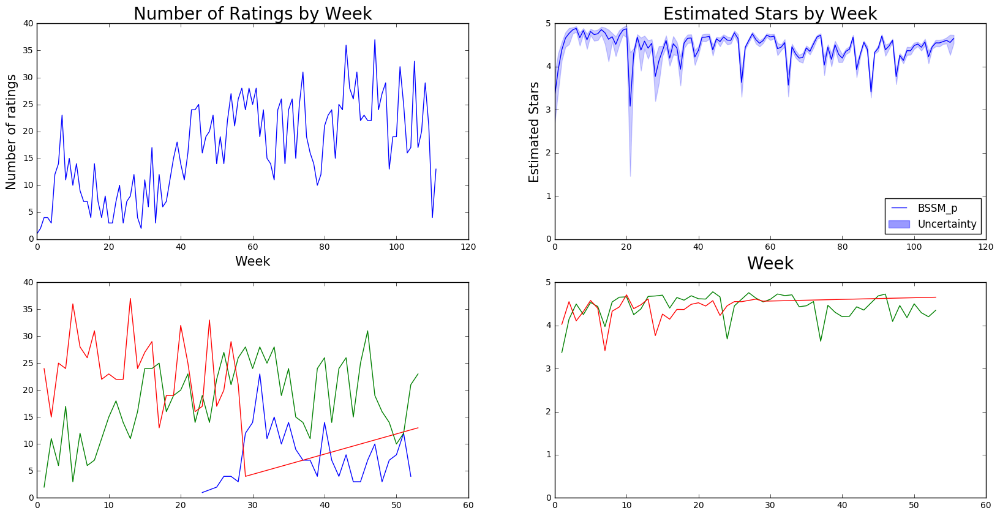

The Peppermill Restaurant & Fireside Lounge


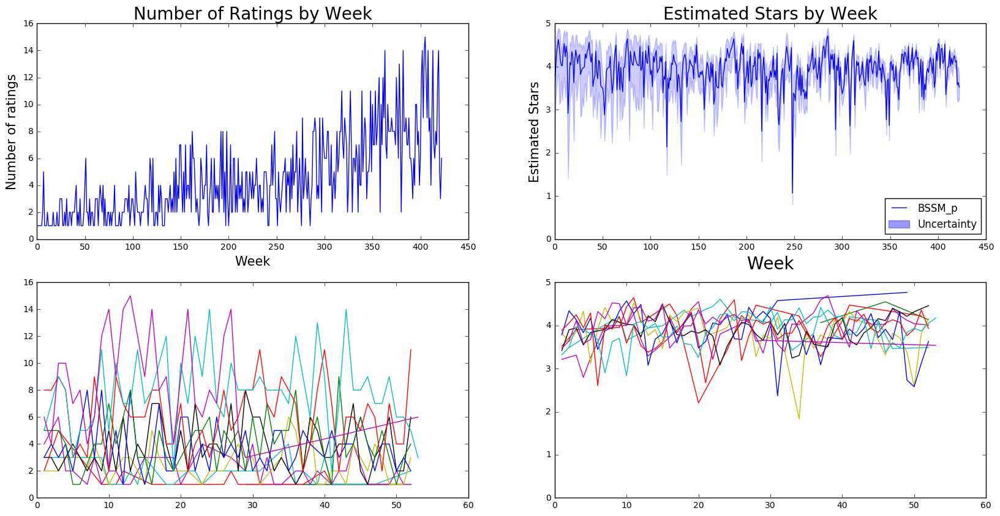

Mandalay Bay Resort & Casino


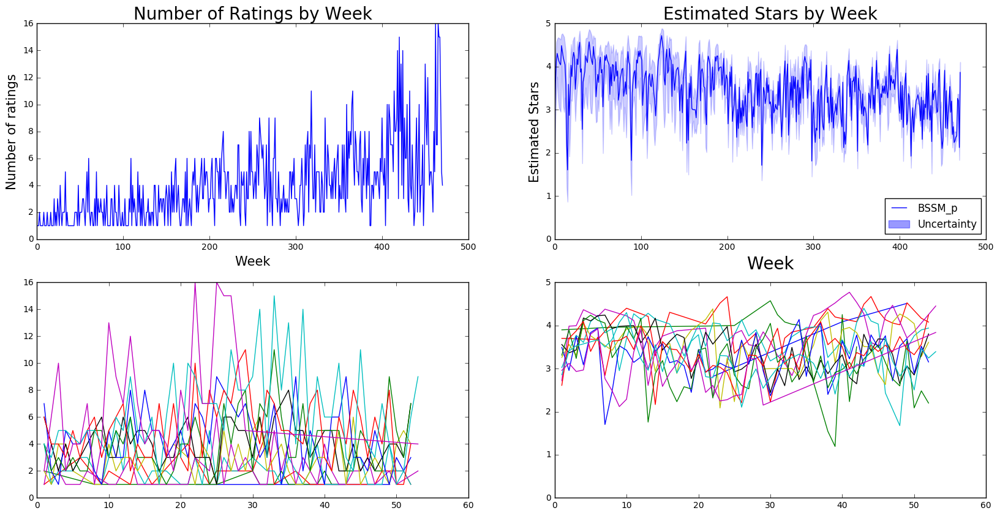

Excalibur Hotel


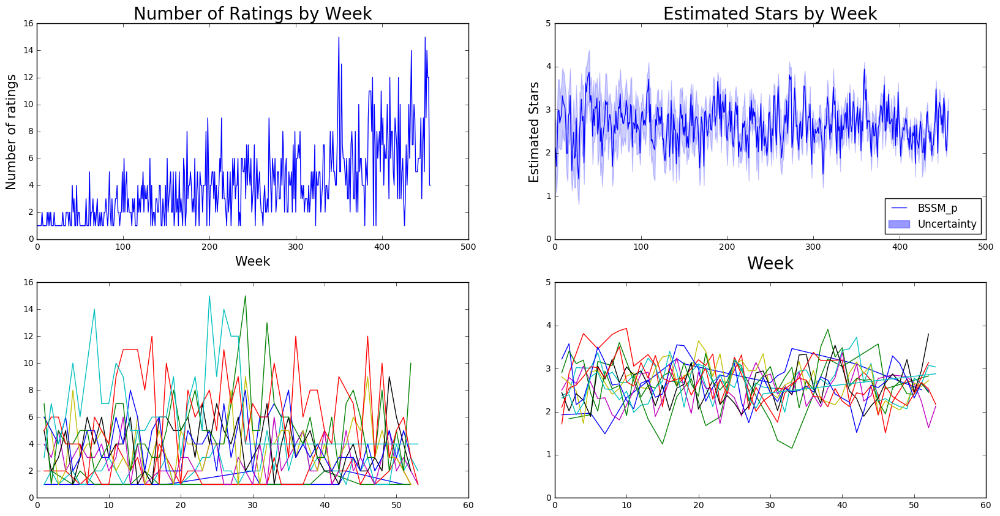

Tao Nightclub


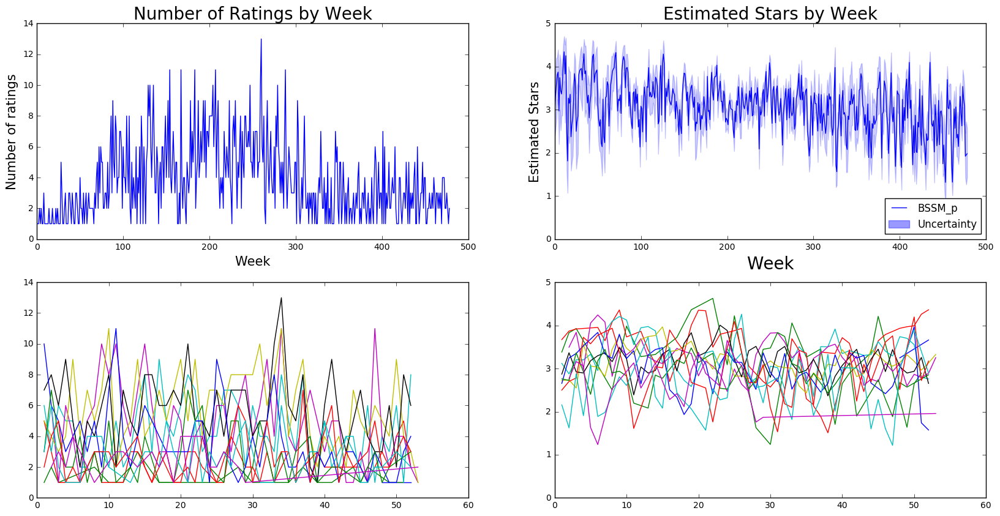

Marquee


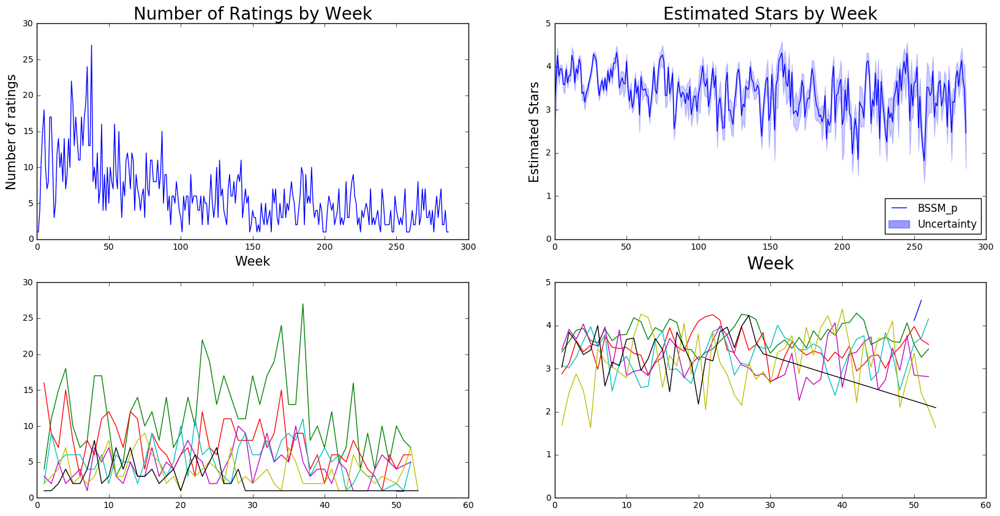

Wynn Las Vegas


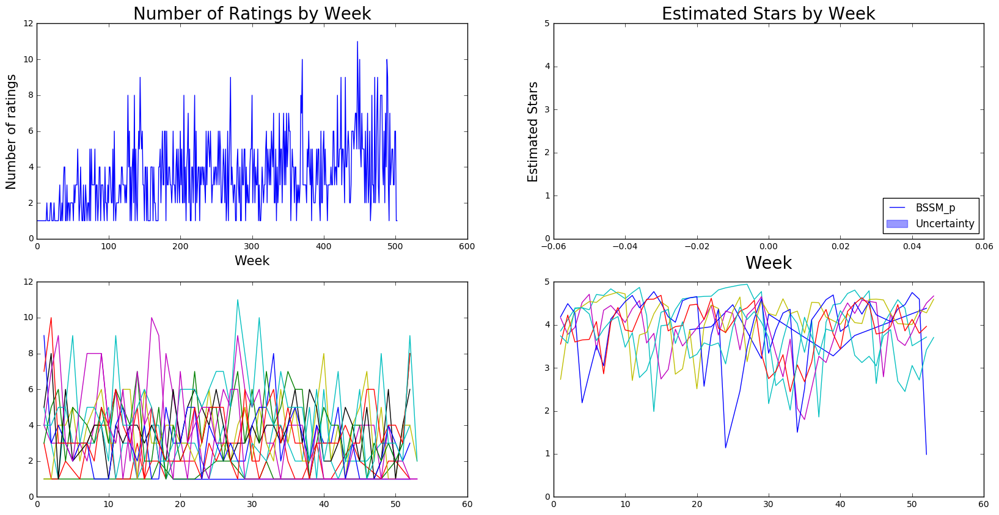

Caesars Palace Las Vegas Hotel & Casino


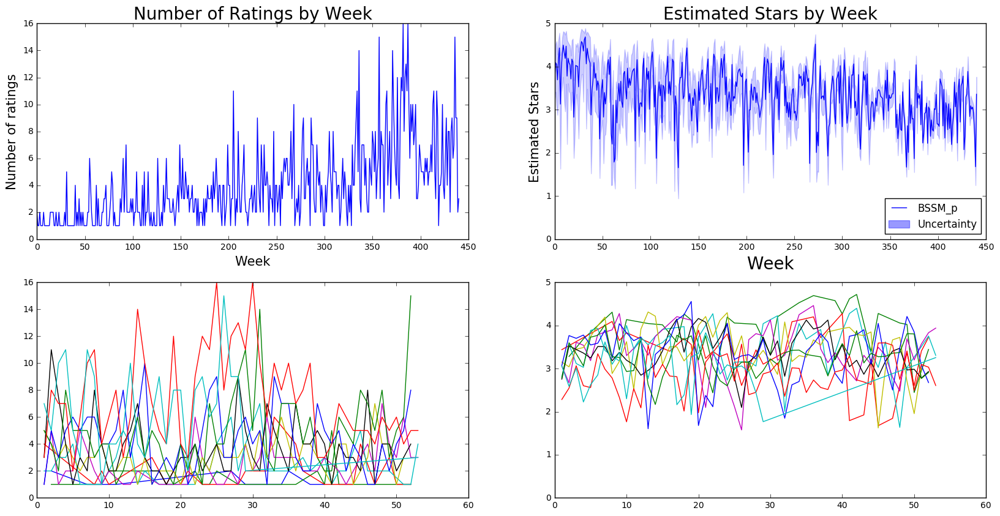

In [124]:
for i in range(20,40):
    ID = num_review_tuple_lv_res[i][0]
    res = Restuarant(ID,business,review)
    res.reviews_week()
    res.plot_reviews()

**User vs Business**

In [137]:
business_lv_res

,attributes.Ambience.divey,attributes.Dietary Restrictions.vegan,attributes.Happy Hour,hours.Thursday.open,attributes.Order at Counter,attributes.Hair Types Specialized In.africanamerican,attributes.Hair Types Specialized In.kids,attributes.BYOB,hours.Friday.open,attributes.Good For.latenight,...,attributes.Noise Level,attributes.Smoking,attributes.Attire,attributes.Hair Types Specialized In.curly,attributes.Good For Groups,neighborhoods,attributes.Open 24 Hours,attributes.Ambience.romantic,attributes.Music.jukebox,attributes.Ambience.upscale
8555,NaN,NaN,True,11:00,NaN,NaN,NaN,True,11:00,False,...,NaN,no,casual,NaN,True,['Summerlin'],NaN,NaN,False,NaN
8773,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,...,average,NaN,casual,NaN,True,[],NaN,False,NaN,False
8817,False,NaN,NaN,00:00,NaN,NaN,NaN,False,00:00,True,...,average,NaN,casual,NaN,True,[],True,False,NaN,False
8892,NaN,NaN,True,11:00,NaN,NaN,NaN,NaN,11:00,False,...,NaN,outdoor,casual,NaN,True,['Southeast'],NaN,NaN,False,NaN
9094,False,NaN,NaN,11:00,NaN,NaN,NaN,NaN,11:00,False,...,average,NaN,casual,NaN,True,['Chinatown'],NaN,False,NaN,False
9095,False,NaN,NaN,06:00,NaN,NaN,NaN,NaN,06:00,True,...,average,NaN,casual,NaN,True,['Chinatown'],NaN,False,NaN,False
9101,True,NaN,NaN,10:00,NaN,NaN,NaN,NaN,10:00,False,...,very_loud,NaN,casual,NaN,True,['Westside'],NaN,False,NaN,False
9105,False,NaN,NaN,09:00,NaN,NaN,NaN,NaN,09:00,False,...,quiet,NaN,casual,NaN,True,['Westside'],NaN,False,NaN,False
9108,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,...,NaN,NaN,casual,NaN,True,['Westside'],NaN,NaN,NaN,NaN
9115,False,NaN,NaN,10:00,NaN,NaN,NaN,NaN,10:00,False,...,quiet,NaN,casual,NaN,True,['Chinatown'],NaN,False,NaN,False


In [ ]:
mexico_res = business_lv_res[business_lv_res]

In [141]:
#restuarants in las vegas
business_lv_res_mex = business[business.categories.map(lambda x: ('Restaurant' in x) and ('Mexican' in x) )]
business_lv_res_mex = business_lv_res_mex[business_lv_res_mex.city == 'Las Vegas']
print "Number of mexican resturants in Las Vegas: " , business_lv_res_mex.shape
num_review_lv_res_mex = review["business_id"].value_counts()
num_review_tuple_lv_res_mex = zip(num_review_lv_res_mex.index,num_review_lv_res)

Number of mexican resturants in Las Vegas:  (619, 98)


In [157]:
#merge with right join, find reviews of mexican restuarants
review_res_mex = pd.merge(business_lv_res_mex, review, on='business_id', how='inner')

In [148]:
review.columns


Index([u'user_id', u'review_id', u'text', u'votes.cool', u'business_id',
       u'votes.funny', u'stars', u'date', u'type', u'votes.useful'],
      dtype='object')

In [158]:
review_res_mex = review_res_mex[['business_id','user_id','stars_y','date']]

In [177]:
review_res_mex['business_id'] =  pd.Series(pd.Categorical(review_res_mex['business_id'].values,
                                          categories = review_res_mex['business_id'].unique())).cat.rename_categories(range(len(review_res_mex['business_id'].unique())))

In [188]:
len(review_res_mex['user_id'].unique())

33655

In [180]:
review_res_mex.groupby([review_res_mex.user_id,review_res_mex.business_id]).agg({"stars_y": lambda x: x.values[0]})            

stars_y
user_id                business_id         
--2QZsyXGz1OhiD4-0FQLQ 345                5
--519Rh5sTtkoUraGzAaKQ 490                5
--65q1FpAL_UQtVZ2PTGew 345                5
--BnK7rx64Gu9KAb2OjMxQ 119                5
                       450                2
                       563                5
--JC6ri9lh1-tazGOFA3yg 85                 3
--RM-_N1-5AiFSzdU5Gn1Q 127                5
--qhwKkTzgBeCH3wEJjg2g 301                4
-0FS8Is93HyIzu0HFSiAJw 450                5
-0O_tG2kBwUjnsIqCptUag 328                4
-0Z9czGOMYe5I9KV26ghgQ 339                2
-0d9f7j5SRAZTaEu0JGvPg 378                1
-0hRSvcY3VxkvLoYA1wz8Q 585                5
-0j-Cfs_nNow45RJGap5IQ 308                3
-0m1syFkZ8cQpRhWV64MNg 538                3
-0npoOcYIFoTGFSCF3ThcA 259                5
-11gXwsf29TALYiN_EUBcw 265                5
-15T0fHe-cPqcfd-C0bOhA 544                5
-1HG57BW_7kd5eBNltH_mw 501                5
                       589                1
                       607                5
-1NrWGGpsOG0taBnhWbV7w 259                2
-1b6urXJhTSTWzvCzHao9Q 127                1
-1vSvHZJ4SmN05pGxz46sA 356                2
-25mTq8FXy8VJ1MjCAVNRg 328                5
                       528                3
-27lSM-gghCCs49o0oHnqw 159                2
-2ElSkWon1NVm4HdB_Qtjg 112                5
-2EuoueswhqEERWezJY8gw 250                3
...                                     ...
zwEYyQHSgdsjU_1o-jODRg 501                5
zwEumzLCaHgP5a2f35wckw 203                5
zwHOQCahSu_CFR4typcnBA 345                2
                       355                4
zwJdK17T3Fv3CTTEWuObfg 429                1
zwNoCdf85jIHeDBl1pRjVQ 235                2
zwayC1M4Tyn2GC4jNyLr-g 430                5
zwls4FpZZYvekas9uuSXRg 97                 1
zwnBhZxh3OzsVYxcxJcvpQ 585                5
zwnd5sF2UQexYax4Wy78Tg 401                5
zwp0VJBl7aaTNtLmSUQlPA 376                1
zwyugYSfDayc_I22Ypi5SA 547                5
zwzLIS-noG9ynASgrNbNgA 401                5
zxClF-IwC796FamUKjiQdA 378                1
zxcbfl2Yqp6U_8VEFeyu_A 297                4
zxp-WLEvv9ERIwFfGuyvtg 348                5
zxxI2AZGXkyPT34SxTDM1g 55                 4
zy3nt9DdlkxDyjx9rzqOIg 398                5
                       468                5
zyE1FM24Ejk4PBmTS_9IRQ 247                5
                       608                5
zygy-qHElFDG119i_64WFA 325                1
zykDGqNXQCqXLmm2fnj42A 99                 5
zys9UkzllE7nJ4j9Iz8Rqw 197                1
zyxPg6L30njr2I1S1RPHvw 501                5
zzGBedEiNvDjriMbtfgbXw 430                5
zzjbYl789JCxRoccM1TpUQ 218                4
zzpT-Mfyh4jEjdqDerSVnQ 116                4
zzvflqB4xAcKFbIbS6HSOw 66                 3
                       345                4

[47768 rows x 1 columns]

In [181]:
a= np.array([1,2,3])

In [182]:
a

array([1, 2, 3])

In [184]:
a[[0,1]] = [2,3]

In [185]:
a

array([2, 3, 3])